In [12]:
!pip install numpy==1.23.5
!pip install pmdarima==2.0.3
!pip install scipy==1.9.3
!pip install statsmodels==0.13.5

In [ ]:
import warnings

import numpy as np
import pandas as pd
from pmdarima.arima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score
from statsmodels.tsa.statespace.sarimax import SARIMAX

warnings.filterwarnings("ignore")

In [2]:
# загрузим данные
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [5]:
stores = sorted(train_df['store'].unique())
products = sorted(train_df['product'].unique())

print(len(stores))  # 7
print(len(products))  # 10

7
10


In [6]:
results = []

for product in products:
    for store in stores:
        subset_train = train_df[(train_df['store'] == store) & (train_df['product'] == product)].copy()
        subset_test = test_df[(test_df['store'] == store) & (test_df['product'] == product)].copy()

        if subset_test.empty:
            continue

        # устанавливим индекс и явно задаём частоту
        subset_train.set_index('Date', inplace=True)
        subset_train.index = pd.to_datetime(subset_train.index)
        subset_train = subset_train.asfreq('D')

        subset_test.set_index('Date', inplace=True)
        subset_test.index = pd.to_datetime(subset_test.index)

        help_model = auto_arima(
            subset_train['number_sold'],
            seasonal=True,
            m=7,
            start_p=0,
            start_q=0,
            max_p=3,
            max_q=3,
            start_P=0,
            start_Q=0,
            max_P=2,
            max_Q=2,
            information_criterion='aic',
            trace=False,
            error_action='ignore',
            suppress_warnings=True,
            stepwise=True
        )

        model = SARIMAX(
            subset_train['number_sold'],
            order=help_model.order,
            seasonal_order=help_model.seasonal_order,
            enforce_stationarity=False,
            enforce_invertibility=False,
            freq='D'  # явно задаём частоту
        )

        model_fit = model.fit(disp=False)

        forecast = model_fit.get_forecast(steps=len(subset_test))
        predicted_values = forecast.predicted_mean

        result = pd.DataFrame({
            'store': store,
            'product': product,
            'Date': subset_test.index,
            'Actual': subset_test['number_sold'],
            'Forecast': predicted_values
        })
        results.append(result)

        print("Продукт:" + str(product) + ". Магазин:" + str(store))

final_results = pd.concat(results, ignore_index=True) if results else pd.DataFrame()

Продукт:0. Магазин:0
Продукт:0. Магазин:1
Продукт:0. Магазин:2
Продукт:0. Магазин:3
Продукт:0. Магазин:4
Продукт:0. Магазин:5
Продукт:0. Магазин:6
Продукт:1. Магазин:0
Продукт:1. Магазин:1
Продукт:1. Магазин:2
Продукт:1. Магазин:3
Продукт:1. Магазин:4
Продукт:1. Магазин:5
Продукт:1. Магазин:6
Продукт:2. Магазин:0
Продукт:2. Магазин:1
Продукт:2. Магазин:2
Продукт:2. Магазин:3
Продукт:2. Магазин:4
Продукт:2. Магазин:5
Продукт:2. Магазин:6
Продукт:3. Магазин:0
Продукт:3. Магазин:1
Продукт:3. Магазин:2
Продукт:3. Магазин:3
Продукт:3. Магазин:4
Продукт:3. Магазин:5
Продукт:3. Магазин:6
Продукт:4. Магазин:0
Продукт:4. Магазин:1
Продукт:4. Магазин:2
Продукт:4. Магазин:3
Продукт:4. Магазин:4
Продукт:4. Магазин:5
Продукт:4. Магазин:6
Продукт:5. Магазин:0
Продукт:5. Магазин:1
Продукт:5. Магазин:2
Продукт:5. Магазин:3
Продукт:5. Магазин:4
Продукт:5. Магазин:5
Продукт:5. Магазин:6
Продукт:6. Магазин:0
Продукт:6. Магазин:1
Продукт:6. Магазин:2
Продукт:6. Магазин:3
Продукт:6. Магазин:4
Продукт:6. Ма

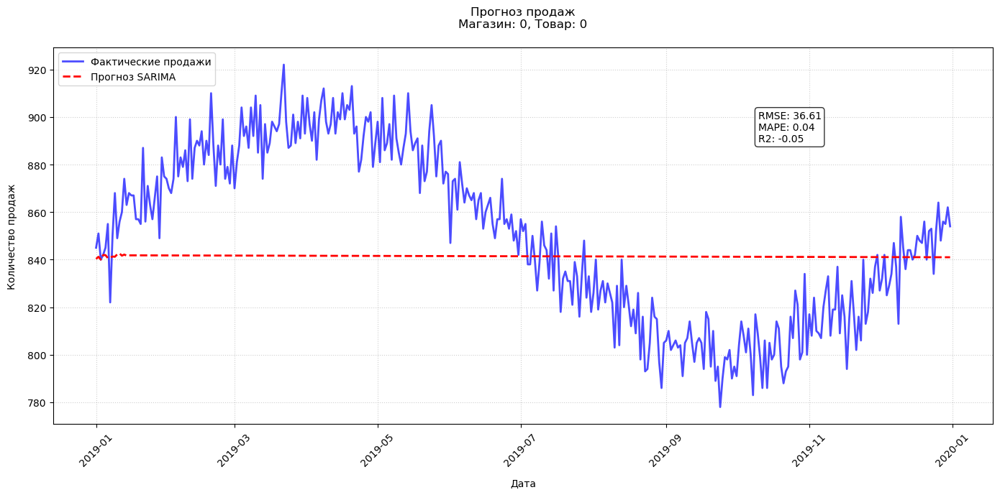

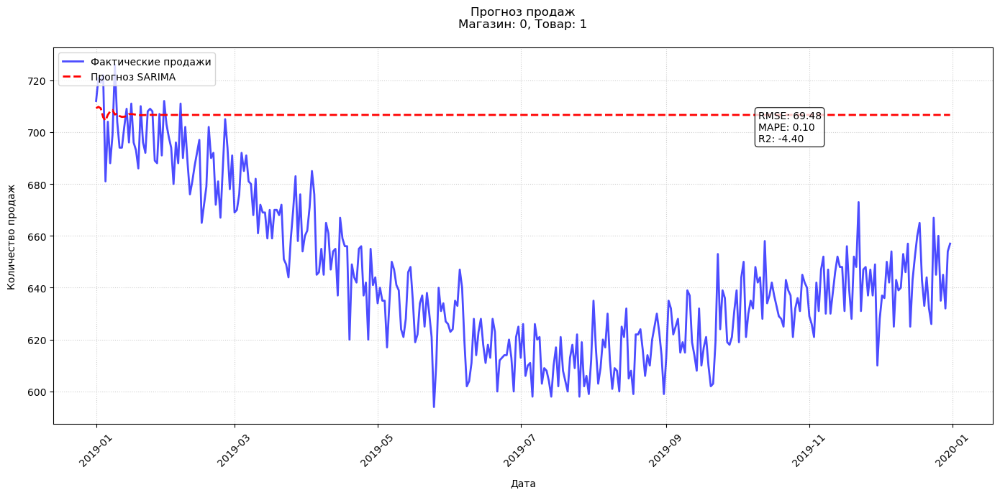

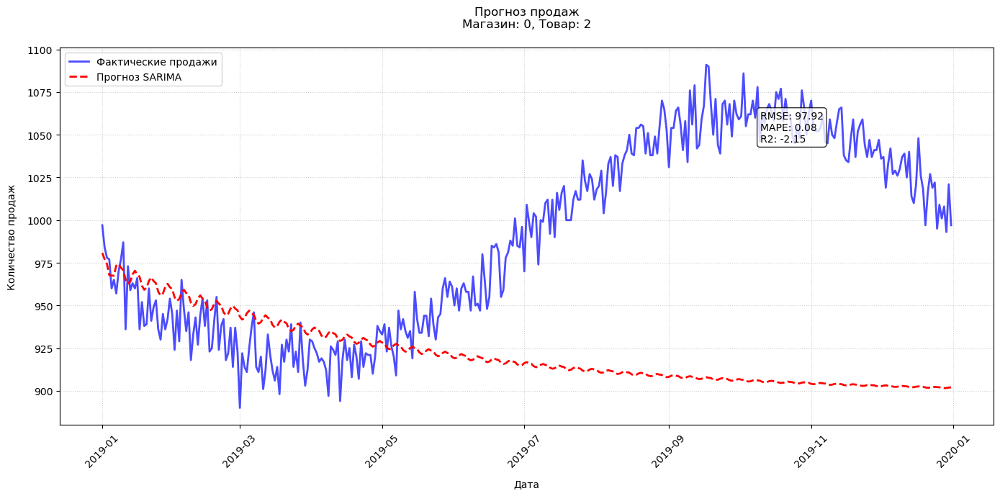

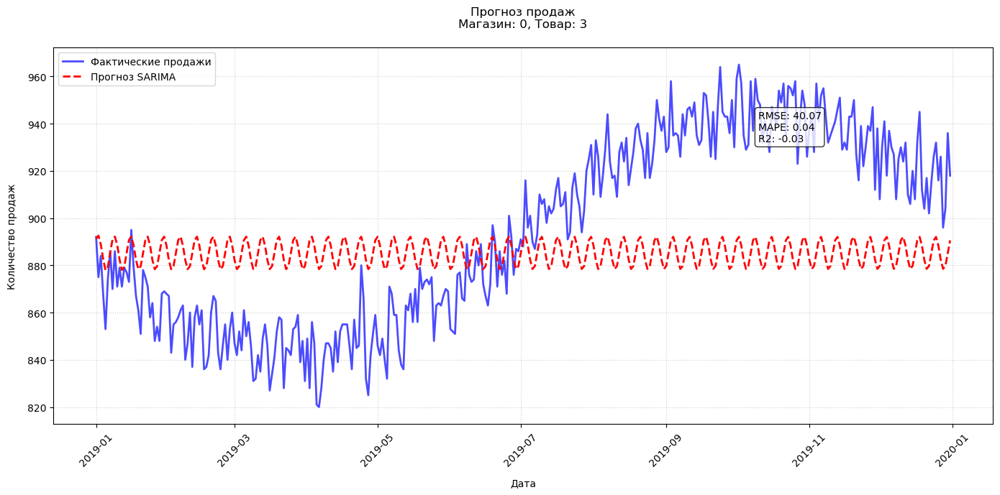

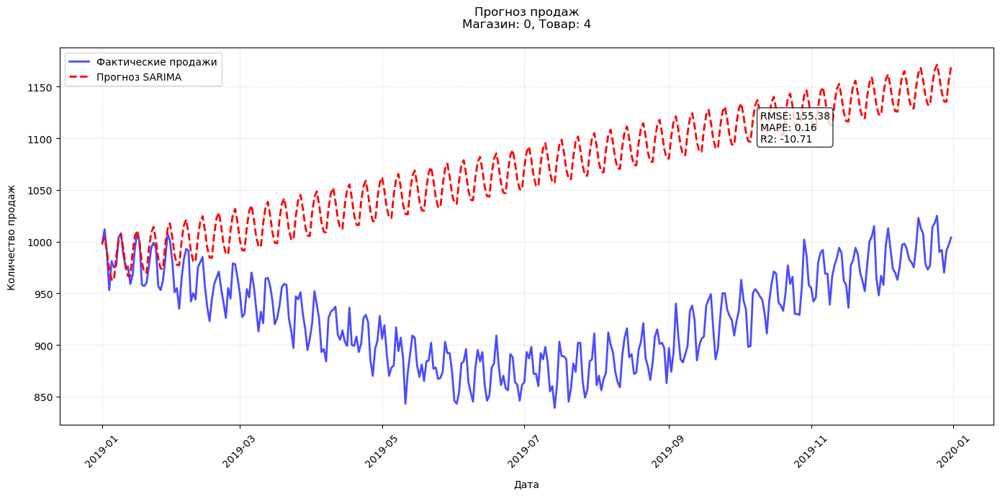

...

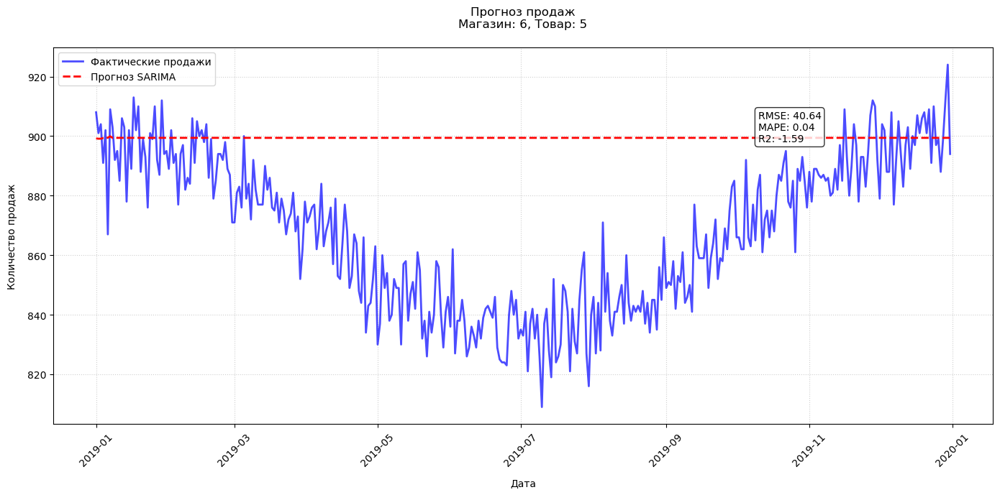

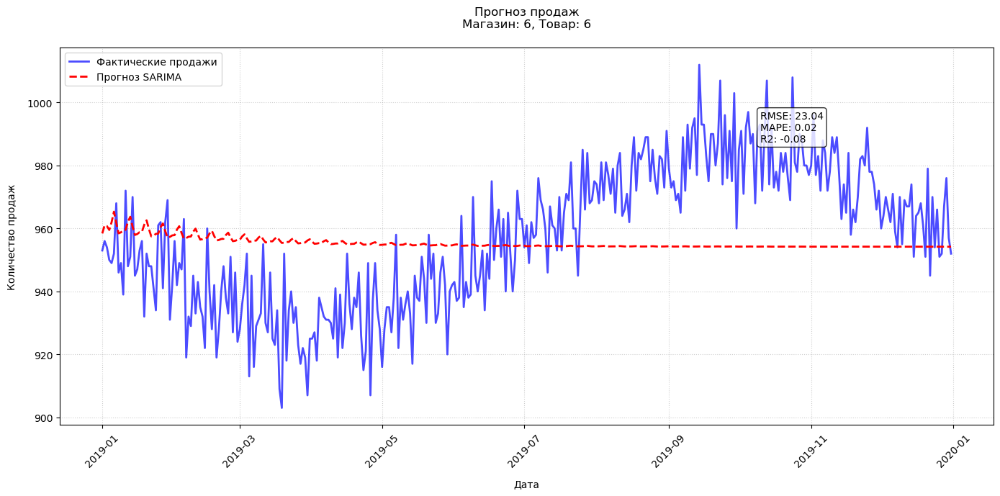

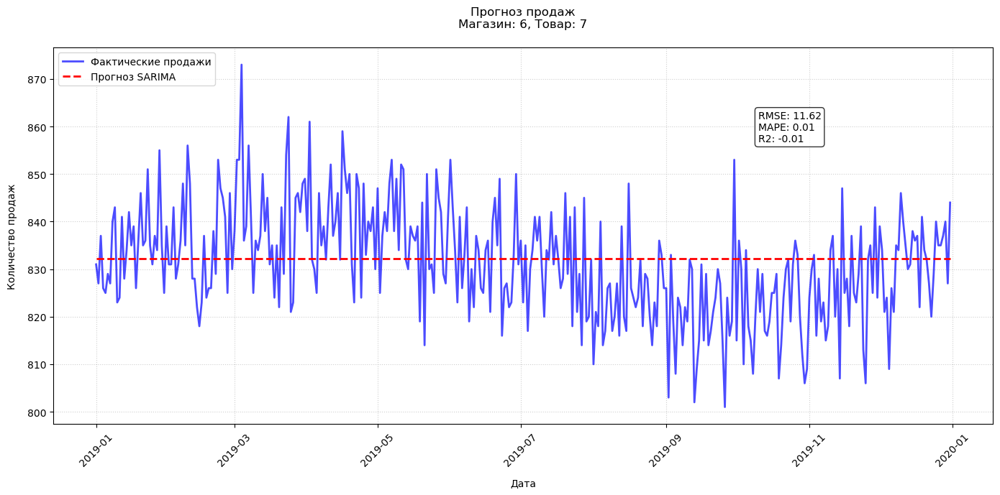

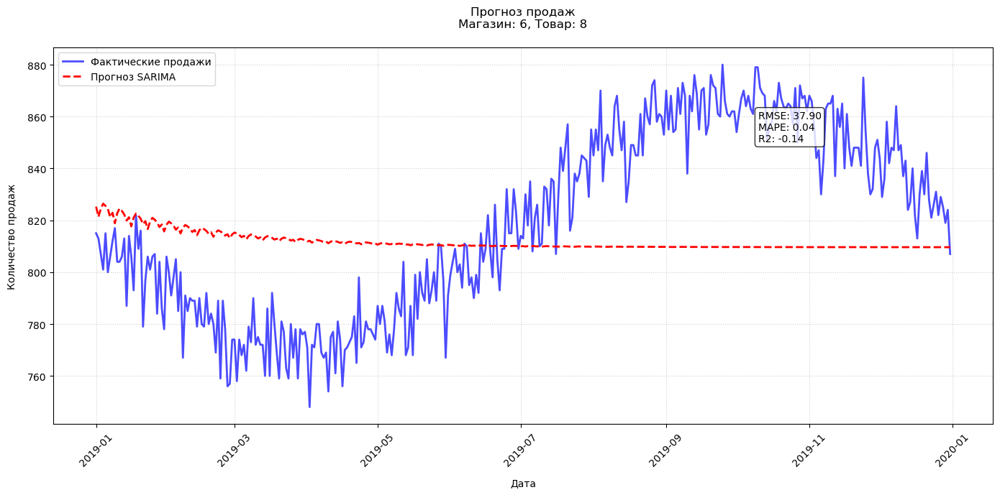

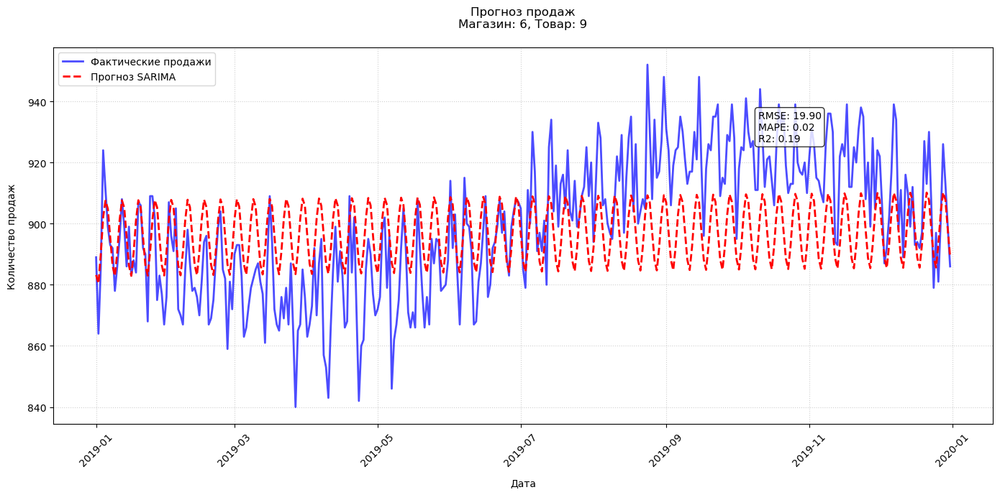

In [7]:

import matplotlib.pyplot as plt


def format_metrics(metrics_dict):
    """Форматирует словарь метрик в читаемую строку"""
    formatted = []
    for k, v in metrics_dict.items():
        if isinstance(v, (int, float)):
            formatted.append(f"{k}: {v:.2f}")
        elif not pd.isna(v):
            formatted.append(f"{k}: {v}")
    return '\n'.join(formatted)


for (store, product), group in final_results.groupby(['store', 'product']):
    plt.figure(figsize=(14, 7))

    # вычислим метрики
    current_metrics = {
        'RMSE': np.sqrt(mean_squared_error(group['Actual'], group['Forecast'])),
        'MAPE': mean_absolute_percentage_error(group['Actual'], group['Forecast'])
        if not (group['Actual'] == 0).any() else np.nan,
        'R2': r2_score(group['Actual'], group['Forecast'])
    }

    # фактические значения
    plt.plot(group['Date'], group['Actual'],
             label='Фактические продажи',
             color='blue',
             alpha=0.7,
             linewidth=2)

    # прогнозируемые значения
    plt.plot(group['Date'], group['Forecast'],
             label='Прогноз SARIMA',
             color='red',
             linestyle='--',
             linewidth=2)

    # добавляем область доверительного интервала
    if 'Confidence_Interval' in group.columns:
        plt.fill_between(group['Date'],
                         group['Confidence_Interval_Lower'],
                         group['Confidence_Interval_Upper'],
                         color='pink',
                         alpha=0.3,
                         label='Доверительный интервал')

    plt.title(f'Прогноз продаж\nМагазин: {store}, Товар: {product}', pad=20)
    plt.xlabel('Дата', labelpad=10)
    plt.ylabel('Количество продаж', labelpad=10)

    # добавляем метрики в аннотацию
    plt.annotate(format_metrics(current_metrics),
                 xy=(0.75, 0.75),
                 xycoords='axes fraction',
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.legend(loc='upper left')
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()